In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score
import numpy
import lightgbm
from xgboost import XGBClassifier
from sklearn.metrics import balanced_accuracy_score

In [5]:
dfB = pd.read_parquet('../feature-extraction/floor/benign_2312_HTML.parquet')


filtered_dfB = dfB.filter(like='html', axis=1)

filtered_dfB['label'] = 'benign'
# Display the filtered DataFrame
print(filtered_dfB['label'])

0         benign
1         benign
2         benign
3         benign
4         benign
           ...  
171217    benign
171218    benign
171219    benign
171220    benign
171221    benign
Name: label, Length: 171222, dtype: object


/tmp/ipykernel_2730235/2951191465.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_dfB['label'] = 'benign'


In [6]:
dfP = pd.read_parquet('../feature-extraction/floor/phishing_2406_strict_HTML.parquet')
filtered_dfP = dfP.filter(like='html', axis=1)
#filtered_dfP = filtered_dfP.add_prefix('html_')
filtered_dfP['label'] = 'phishing'
filtered_dfP

/tmp/ipykernel_2730235/879513332.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_dfP['label'] = 'phishing'


,html_create_element,html_write,html_char_code_at,html_concat,html_escape,html_eval,html_exec,html_from_char_code,html_link,html_parse_int,...,html_num_of_form_js,html_malicious_form,html_most_common,html_num_of_css_internal,html_num_of_css_external,html_num_of_anchors_to_content,html_num_of_anchors_to_void,html_num_of_blank_spaces,html_blocked_keywords_label,label
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,91,0,phishing
1,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,21,0,phishing
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,17,0,phishing
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,166,0,phishing
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,4,0,phishing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,53,0,phishing
24583,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,21,0,phishing
24584,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,4045,1,phishing
24585,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,239,0,phishing


In [7]:
filtered_dfB.dropna(inplace=True)
filtered_dfP.dropna(inplace=True)
combined_df = pd.concat([filtered_dfB, filtered_dfP], axis=0)

/tmp/ipykernel_2730235/1271725341.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_dfB.dropna(inplace=True)
/tmp/ipykernel_2730235/1271725341.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_dfP.dropna(inplace=True)


In [8]:
combined_df

,html_create_element,html_write,html_char_code_at,html_concat,html_escape,html_eval,html_exec,html_from_char_code,html_link,html_parse_int,...,html_num_of_form_js,html_malicious_form,html_most_common,html_num_of_css_internal,html_num_of_css_external,html_num_of_anchors_to_content,html_num_of_anchors_to_void,html_num_of_blank_spaces,html_blocked_keywords_label,label
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,benign
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,30,0,benign
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,422,0,benign
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,benign
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,5,0,benign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24582,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,53,0,phishing
24583,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,21,0,phishing
24584,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,4045,1,phishing
24585,1,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,239,0,phishing


In [9]:
bool_cols = combined_df.select_dtypes(include='bool').columns
print(bool_cols)
combined_df[bool_cols] = combined_df[bool_cols].astype(int)

pdaFeatures = combined_df.loc[:, combined_df.columns != "label"] # get features
pdaLabel = pd.DataFrame() 
pdaLabel["label"] = combined_df["label"] # get labels

#class_map = {'benign': 0, 'phishing': 1}
#pdaLabel = pdaLabel['label'].apply(lambda x: class_map[x]) # y vector ###

print(len(pdaFeatures))

Index(['html_no_hrefs'], dtype='object')
195809


In [10]:
dX_train, X_test, y_train, y_test = train_test_split(pdaFeatures, pdaLabel, test_size=0.20, random_state=42) # split data into training and testing data
ratio = (y_train["label"] == 0).sum() / (y_train["label"] == 1).sum()


/tmp/ipykernel_2730235/188274676.py:2: RuntimeWarning: invalid value encountered in scalar divide
  ratio = (y_train["label"] == 0).sum() / (y_train["label"] == 1).sum()


In [11]:
## Model Validation Functions

In [24]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, log_loss, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from kneed import KneeLocator

# Helpers
from kneed import KneeLocator

def plot_metric(metric):
    plt.rcParams["figure.dpi"] = 300
    
    # Plot metric curves
    plt.plot(x_axis, results['valid_0'][metric], label='Training set')
    plt.plot(x_axis, results['valid_1'][metric], label='Testing set')
    
    # Detect elbow using Kneedle algorithm
    kn = KneeLocator(x_axis, results['valid_1'][metric], curve='convex', direction='decreasing')
    if kn.knee:
        plt.vlines(kn.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', colors='red', label='Elbow at tree ' + str(kn.knee))
    
    plt.legend()
    mnames = {'error': 'Classification Error', 'binary_logloss': 'Log Loss', 'auc': 'AUC'}
    mname = mnames.get(metric, metric)  # Return the metric itself if it's not in the dictionary
    plt.ylabel(mname)
    plt.xlabel('Number of trees')
    plt.title('LightGBM ' + mname)
    plt.show()

    
# Tuning - graphs
def DisplayTuningGraph(scores):
    from numpy import array
    from numpy.ma import masked_array

    col_names = ['mean_train_score', 'mean_test_score']
    means_df = scores[col_names]
    ax = means_df.plot(kind='line', grid=True)

    from matplotlib import pyplot as plt
    plt.rcParams["figure.figsize"] = [12, 12]
    plt.rcParams["figure.autolayout"] = True

    plt.rcParams["figure.dpi"] = 300

    max_ids = means_df.idxmax(axis=0)

    for i in range(len(max_ids)):
        for col_name in col_names:
            value = means_df[col_name][max_ids[i]]
            id = max_ids[i]

            color = 'r' if max_ids[i] == max_ids['mean_test_score'] else 'grey'

            ax.scatter([id], [value],
                      marker='o',
                      color=color,
                      label='point',)

            ax.annotate(str(round(value, 3))+"_ID="+str(id),
                        (id, value),
                        xytext=(id+3, value))
    print(scores)

def ValidateModel_advanced(X_test, y_test, model): 
    y_pred = model.predict(X_test)
    
    # Classification report
    print(classification_report(y_test, y_pred, digits=4))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
    tn, fp, fn, tp = cm.ravel()
    print("Confusion Matrix:")
    print("TN:", tn, "FP:", fp, "FN:", fn, "TP:", tp)

    # Plotting ROC Curve
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else model.decision_function(X_test)
    fpr, tpr, _ = roc_curve(y_test, y_prob, pos_label="phishing")
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

    # Model-specific evaluations
    if isinstance(model, (XGBClassifier, LGBMClassifier)):
        
        if isinstance(model, (XGBClassifier)):
            results = model.evals_result()
        elif isinstance(model, (LGBMClassifier)):
            results = model.evals_result_

        training_key = 'valid_0' if isinstance(model, LGBMClassifier) else 'validation_0'
        validation_key = 'valid_1' if isinstance(model, LGBMClassifier) else 'validation_1'
        
        print("Training metrics:", results[training_key].keys())
        print("Validation metrics:", results[validation_key].keys())

        trees = len(results[validation_key]['binary_logloss']) if isinstance(model, LGBMClassifier) else len(results[validation_key]['logloss'])
        x_axis = range(0, trees)

        def plot_metric(metric):
            plt.rcParams["figure.dpi"] = 300

            # Plot metric curves
            plt.plot(x_axis, results[training_key][metric], label='Training set')
            plt.plot(x_axis, results[validation_key][metric], label='Validation set')

            # Detect elbow using Kneedle algorithm
            kn = KneeLocator(x_axis, results[validation_key][metric], curve='convex', direction='decreasing')
            if kn.knee:
                plt.vlines(kn.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', colors='red', label='Elbow at tree ' + str(kn.knee))

            plt.legend()
            mnames = {'binary_logloss': 'Log Loss', 'auc': 'AUC'}
            mname = mnames.get(metric, metric)
            plt.ylabel(mname)
            plt.xlabel('Number of trees')
            plt.title(f'{type(model).__name__} {mname}')
            plt.show()

        if isinstance(model, LGBMClassifier):
            plot_metric('binary_logloss')
        elif isinstance(model, XGBClassifier):
            plot_metric('logloss')
            
        plot_metric('auc')
        
    elif isinstance(model, (RandomForestClassifier, AdaBoostClassifier)):
        # For RandomForest and AdaBoost, additional model-specific evaluations can be added here
        pass
    
    # Display the confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=model.classes_)  # Compute confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)  # Create display object
    disp.plot(cmap=plt.cm.Blues)  # Plot confusion matrix
    plt.show()  # Show the plot

In [19]:
## Training

In [60]:
lightGBMClas = lightgbm.LGBMClassifier(
    objective="binary",
    #is_unbalance=True,
    max_depth=9,
    num_leaves=261,
    n_estimators=180,
    lambda_l1=0.0017993225169621843,
    lambda_l2=0.0006301826170072739,
    bagging_fraction=0.16163071559346373,
    bagging_freq=0,
    max_bin=800,
    learning_rate=0.05437419665350978,
    min_child_samples=3,
    boosting_type="gbdt",
    min_split_gain=0.000010284197711702238,
    pos_bagging_fraction=0.8451744872078454,
    neg_bagging_fraction=0.8714695064033464,
    colsample_bytree=0.42342506718022915,
    verbosity=-1,
    seed = 500,
    scale_pos_weight = 0.1,
    metric=['error', 'binary_logloss', 'auc']
) # set hyperparameters

#model = lgb.LGBMClassifier(**params, )

npLabel: numpy.ndarray = y_train.to_numpy() 
eval_set = [(dX_train, npLabel.ravel()), (X_test, y_test)]
lightGBMClas.fit(dX_train, npLabel.ravel(), eval_set=eval_set) # fit model
prediction = lightGBMClas.predict(X_test)
print("F1 score: ", f1_score(y_test, prediction,pos_label='phishing'))
print("Accuracy: ", accuracy_score(y_test, prediction))
print("Balanced accuracy: ", balanced_accuracy_score(y_test, prediction))

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


F1 score:  0.9514082992904752
Accuracy:  0.9884581992748072
Balanced accuracy:  0.953895522510235


In [61]:
import joblib
joblib.dump(lightGBMClas, "models/phishing_html_lgbm_model.joblib")

['models/phishing_html_lgbm_model.joblib']

              precision    recall  f1-score   support

      benign     0.9871    0.9999    0.9935     34288
    phishing     0.9993    0.9079    0.9514      4874

    accuracy                         0.9885     39162
   macro avg     0.9932    0.9539    0.9724     39162
weighted avg     0.9886    0.9885    0.9882     39162

Confusion Matrix:
TN: 34285 FP: 3 FN: 449 TP: 4425


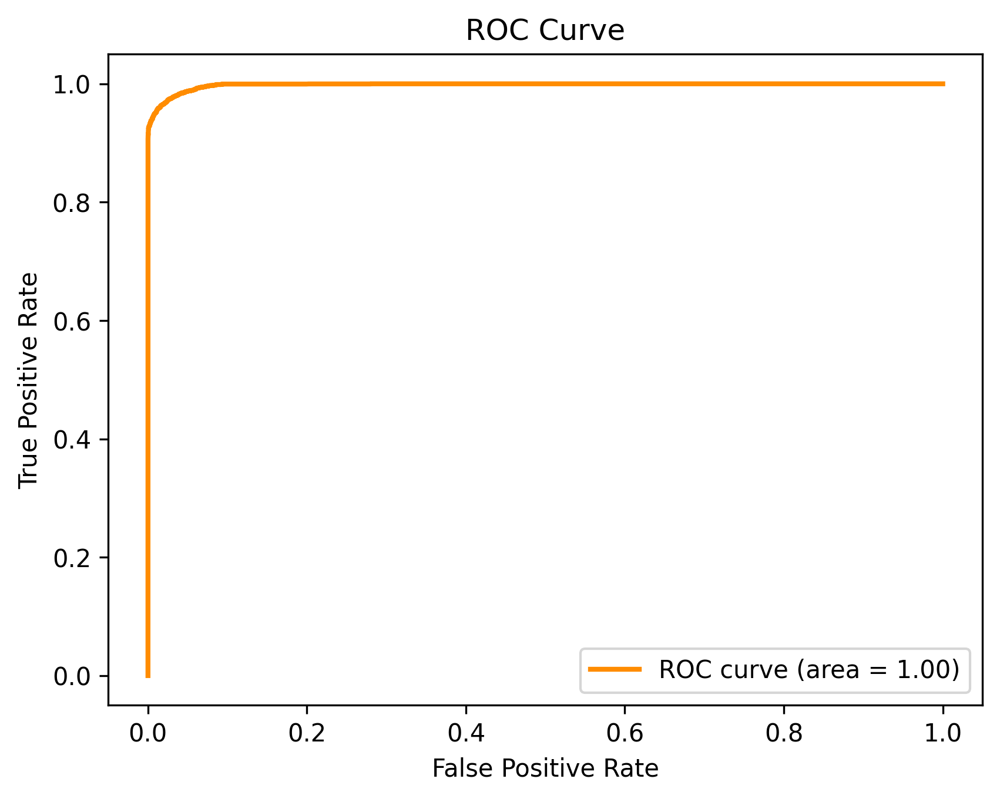

Training metrics: odict_keys(['binary_logloss', 'auc'])
Validation metrics: odict_keys(['binary_logloss', 'auc'])


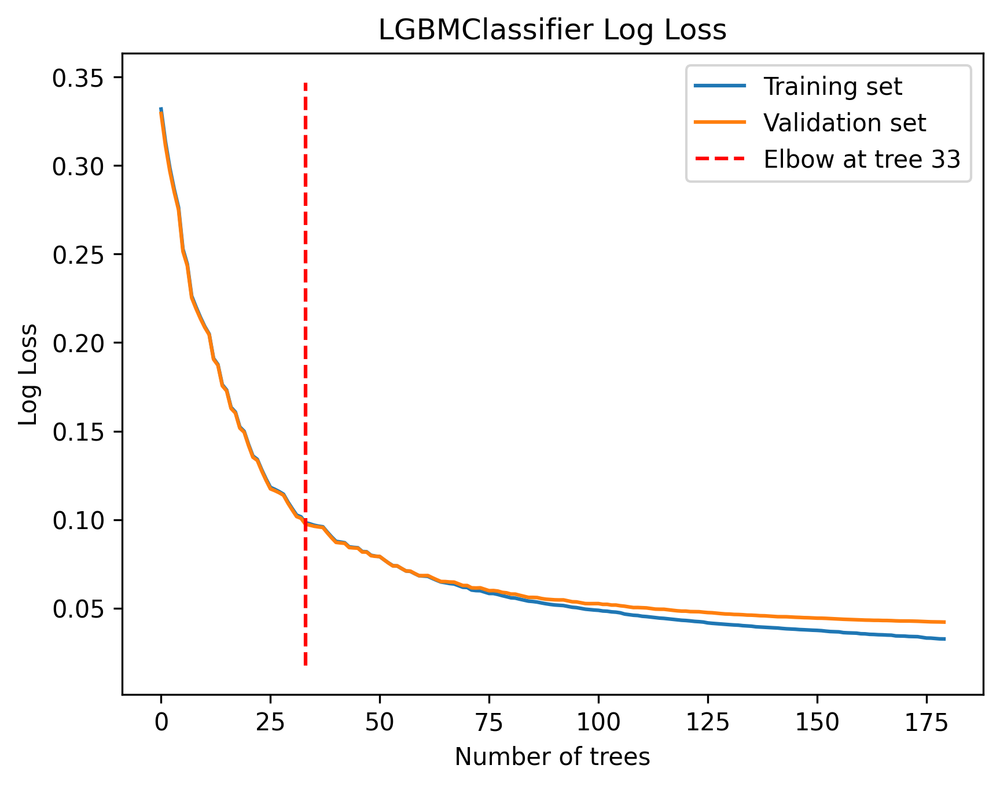

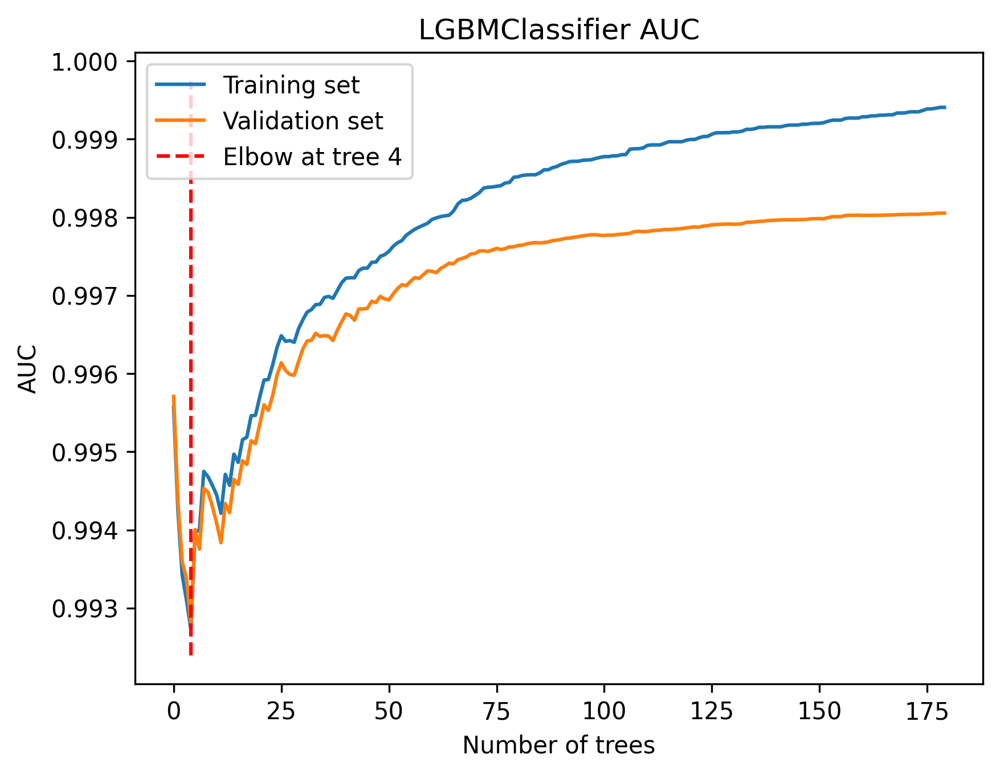

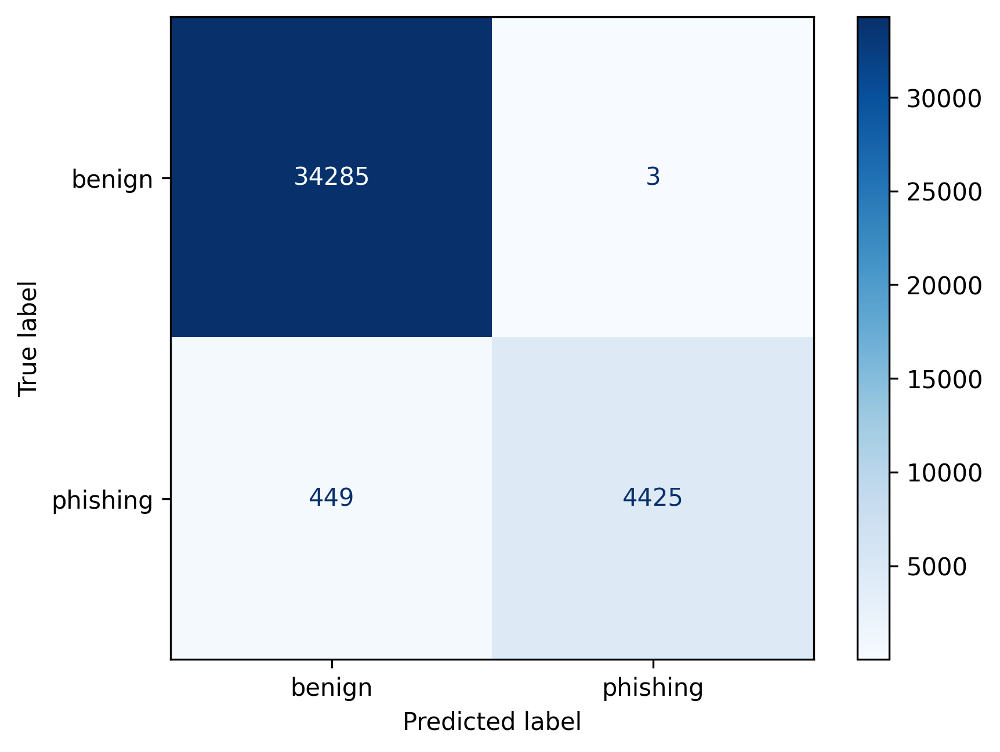

In [62]:
ValidateModel_advanced(X_test, y_test, lightGBMClas)

In [26]:
## Test on another validation dataset

Accuracy: 0.28798185941043086
Weighted Accuracy: 0.5221192030692603
Precision: 0.19605263157894737
Recall: 0.8975903614457831
F1 Score: 0.32181425485961124
False Positive Rate: 0.8533519553072626


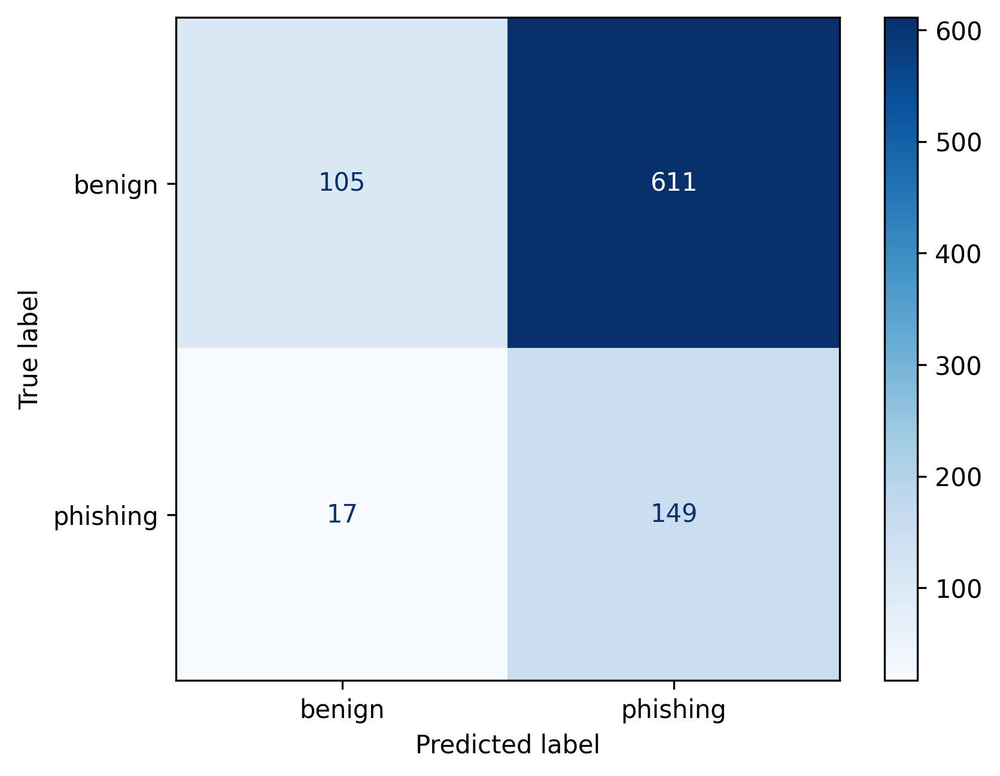

Misclassified domains: ['www.firstdirect.com', 'www.silvini.sk', 'identity.spstrplz.cz', 'eu.marcelomiracles.store', 'swimswam.com', 'www.fitloon.sk', 'galaxiebarev.cz', 'beautybio.com', 'www.vmall.com', 'image.google.sc', 'englishstudypage.com', 'v2.thecrackstreams.live', 'membership-admin.appstle.com', 'rijswijksdagblad.nl', 'www.stehujemehned.cz', 'hithouse.pro', 'www.msplanany.cz', 'atlas-auth.cern.ch', 'zakazky.pardubickykraj.cz', 'sinprofaz.org.br', 'cri.gov.lk', 'www.taboryprovsechny.cz', 'www.blondieinmorocco.com', 'www.jezikinslovstvo.com', 'www.securityconcepts.be', 'rossmann.gazetki-promocyjne.net.pl', 'app.termly.io', 'www.lacomediedevanneau.com', 'cs.cas.cz', 'www.cliquef5.com.br', 'pc-politika.cz', 'www.vsh.cz', 'jessiemakinson.co.uk', 'korean.stackexchange.com', 'app.popt.in', 'www.deutschlandfunknova.de', 'kiwithek.wien', 'kamako.sk', '0948481wklnyj.plenoinversiones.cl', 'venerologie.cz', 'textilegu.ru', 'essaybox.org', 'meethettich.webex.com', 'api.3dlook.me', 'restaur

In [63]:
# Map the predictions to integers
y_pred = pd.Series(y_pred).map({'benign': 0, 'phishing': 1})

# Ensure there are no NaN values after mapping (which could happen if some predictions are outside the expected values)
if y_pred.isnull().any():
    print("There are unmapped values in y_pred. Exiting...")
else:
    # Calculate metrics
    accuracy = accuracy_score(y_val, y_pred)
    weighted_accuracy = (accuracy_score(y_val[y_val == 0], y_pred[y_val == 0]) + accuracy_score(y_val[y_val == 1], y_pred[y_val == 1])) / 2
    precision = precision_score(y_val, y_pred)
    recall = recall_score(y_val, y_pred)
    f1 = f1_score(y_val, y_pred)
    tn, fp, fn, tp = confusion_matrix(y_val, y_pred).ravel()
    false_positive_rate = fp / (fp + tn)

    # Display metrics
    print(f'Accuracy: {accuracy}')
    print(f'Weighted Accuracy: {weighted_accuracy}')
    print(f'Precision: {precision}')
    print(f'Recall: {recall}')
    print(f'F1 Score: {f1}')
    print(f'False Positive Rate: {false_positive_rate}')

    # Display confusion matrix
    cm = confusion_matrix(y_val, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['benign', 'phishing'])
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

    # Identify misclassified domain names
    misclassified = df_validation[y_val != y_pred]
    misclassified_domains = misclassified['domain_name'].tolist()
    print(f'Misclassified domains: {misclassified_domains}')


Domain: www.firstdirect.com


LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


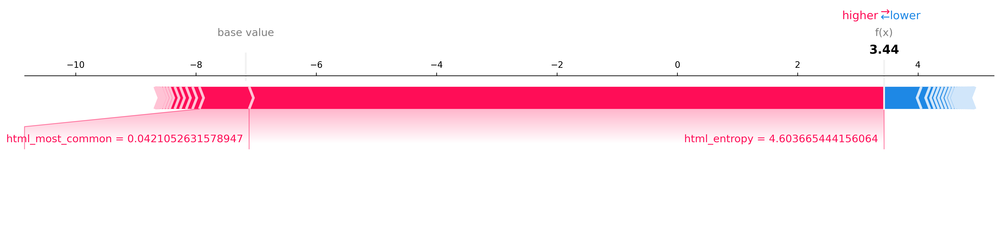

Domain: www.silvini.sk


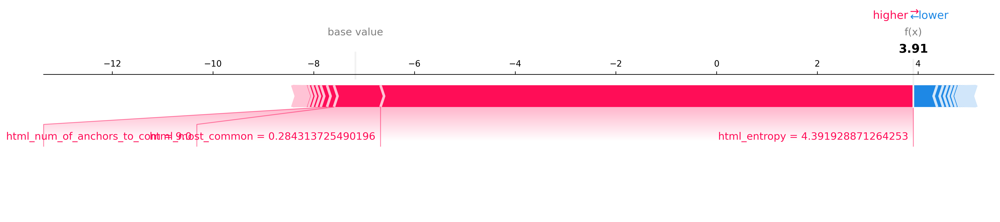

Domain: identity.spstrplz.cz


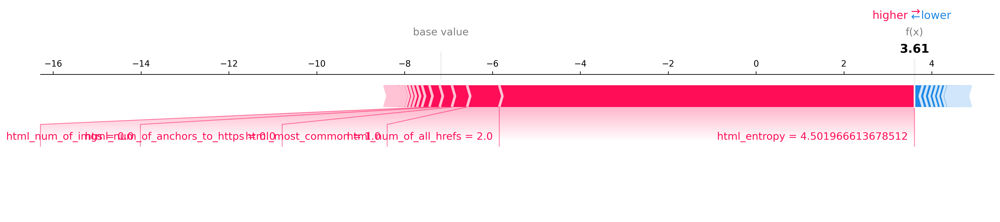

Domain: eu.marcelomiracles.store


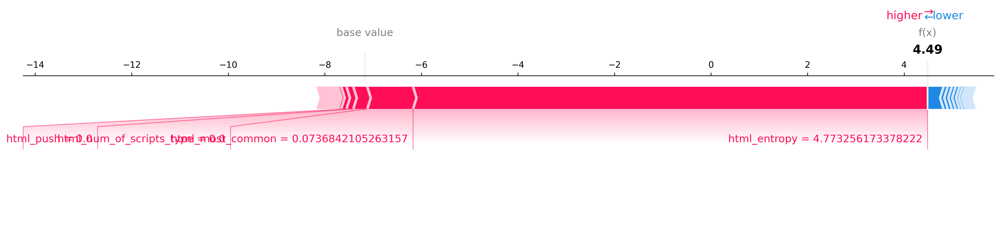

Domain: swimswam.com


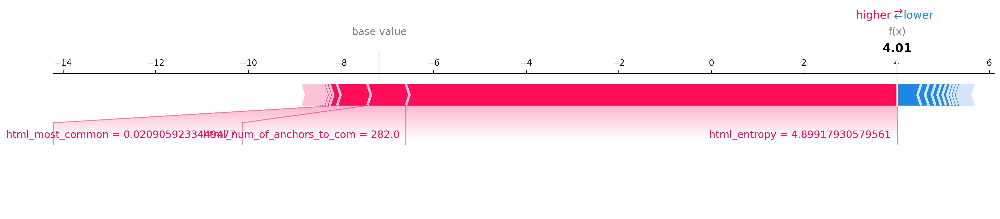

Domain: www.fitloon.sk


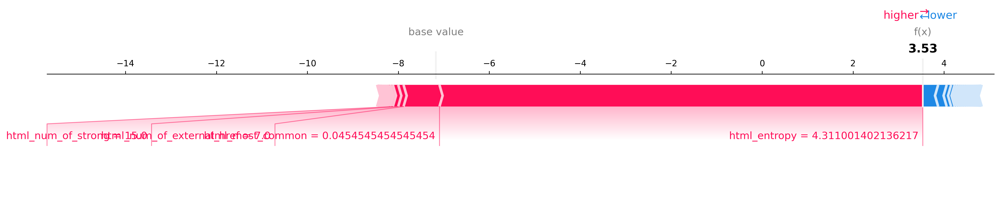

Domain: galaxiebarev.cz


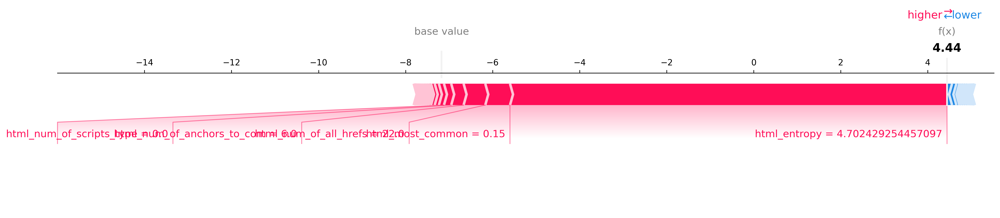

Domain: beautybio.com


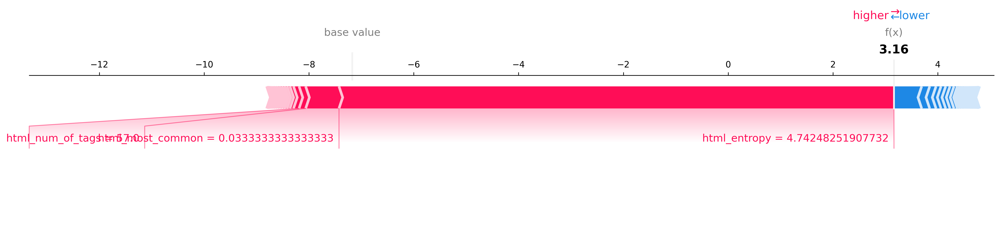

Domain: www.vmall.com


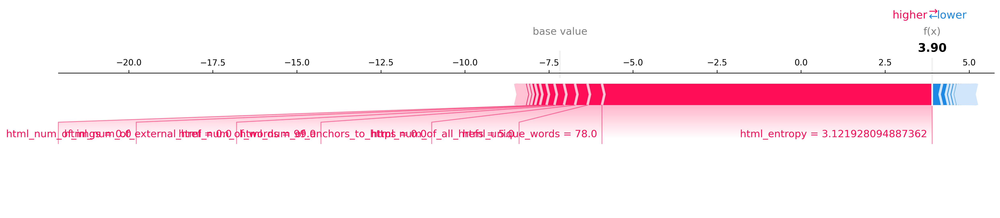

Domain: image.google.sc


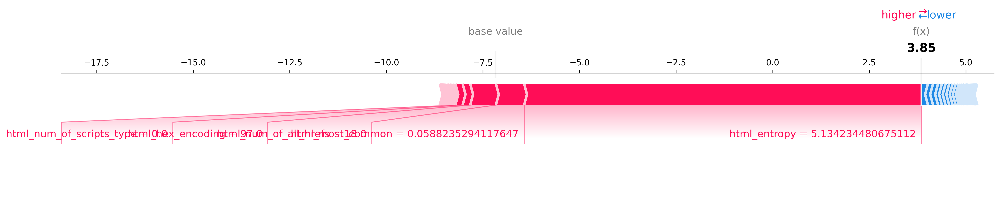

Domain: englishstudypage.com


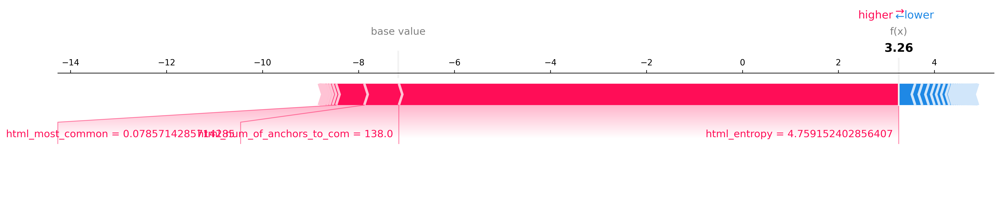

Domain: v2.thecrackstreams.live


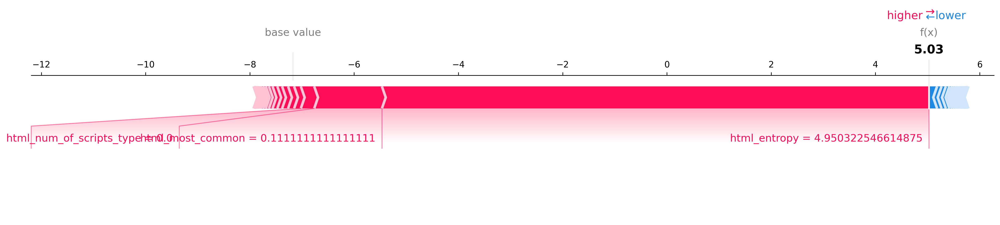

Domain: membership-admin.appstle.com


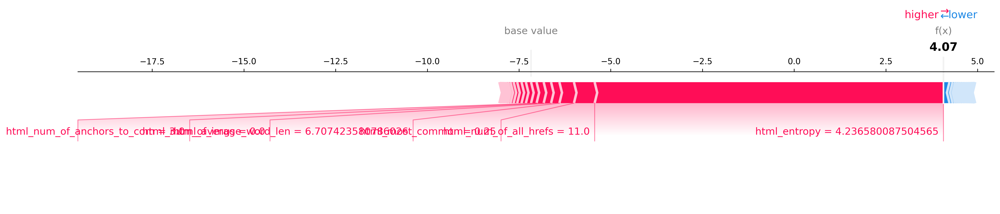

Domain: rijswijksdagblad.nl


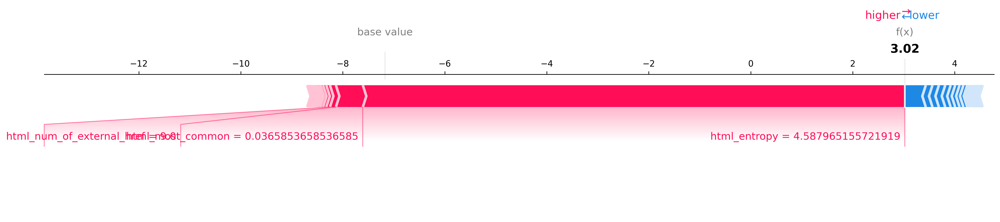

Domain: www.stehujemehned.cz


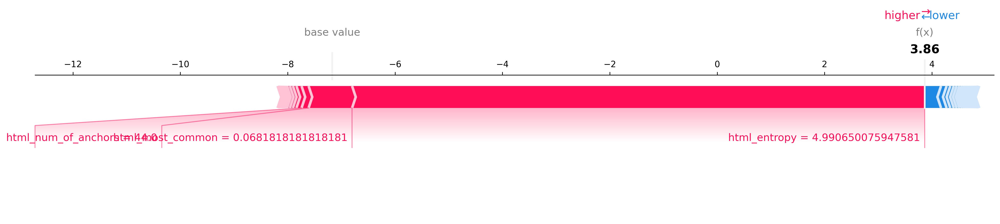

Domain: hithouse.pro


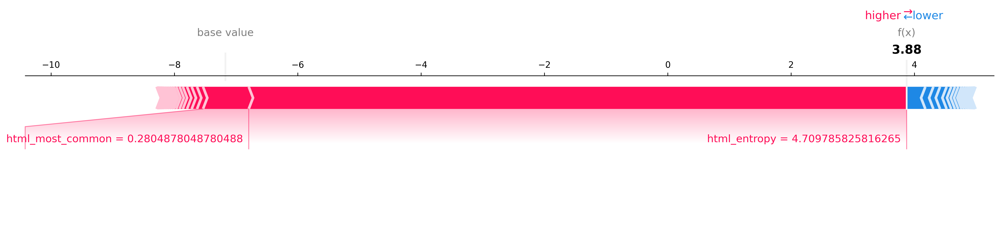

Domain: www.msplanany.cz


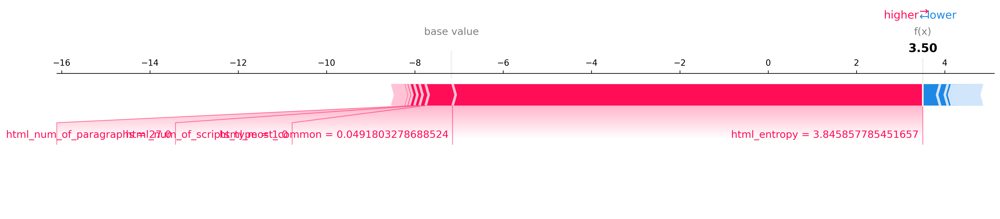

Domain: atlas-auth.cern.ch


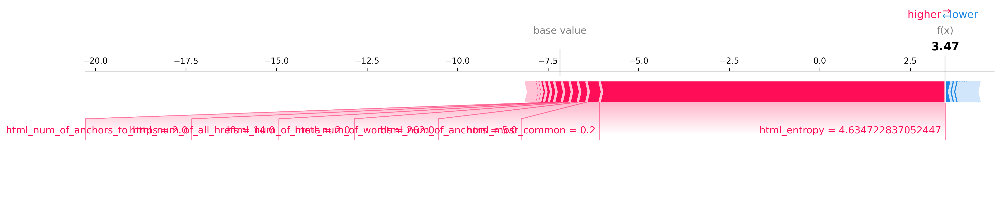

Domain: zakazky.pardubickykraj.cz


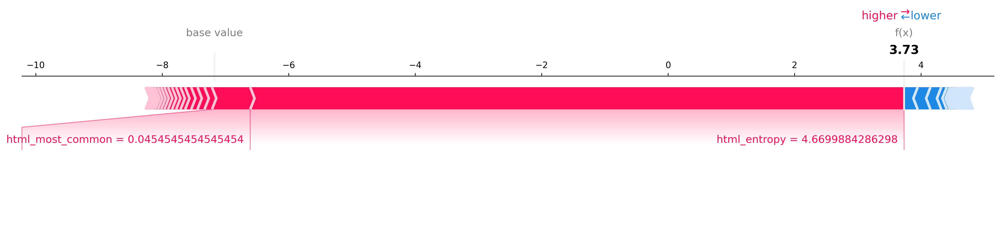

Domain: sinprofaz.org.br


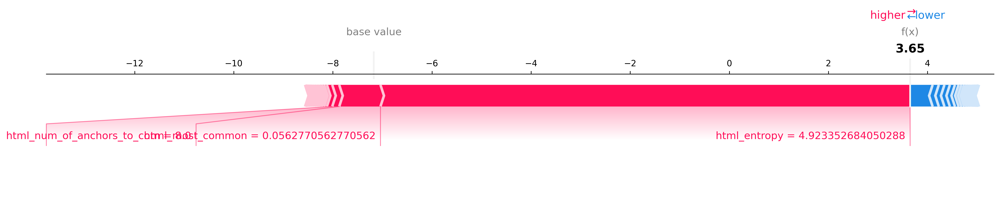

Domain: cri.gov.lk


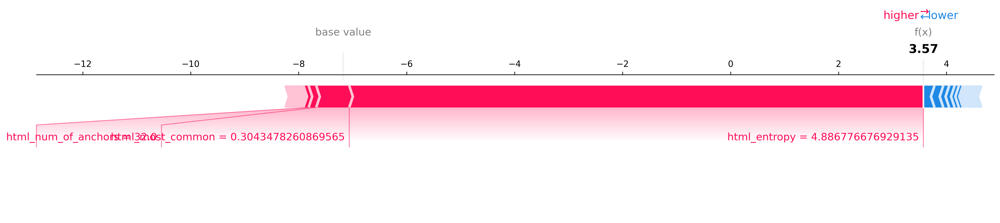

Domain: www.taboryprovsechny.cz


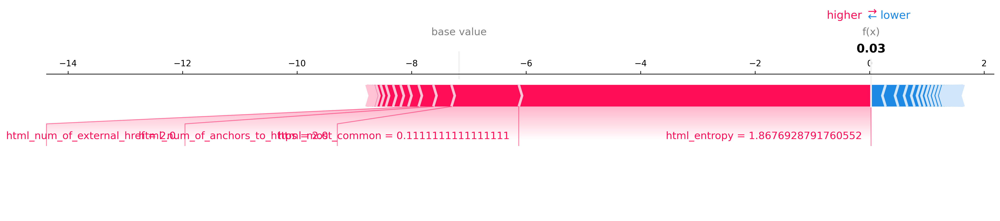

Domain: www.blondieinmorocco.com


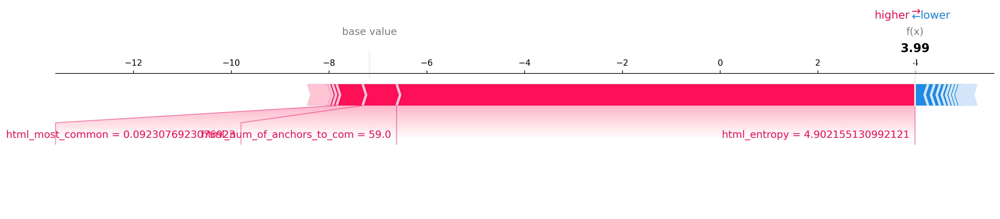

Domain: www.jezikinslovstvo.com


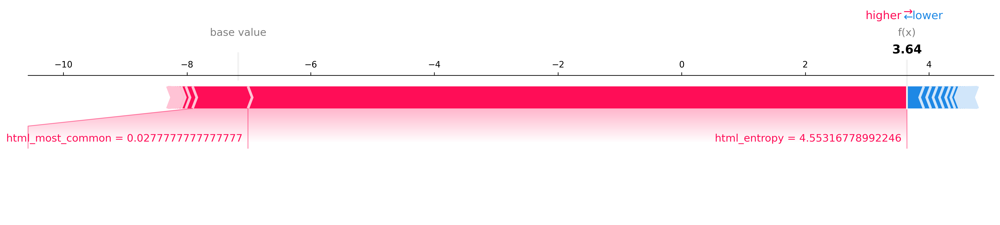

Domain: www.securityconcepts.be


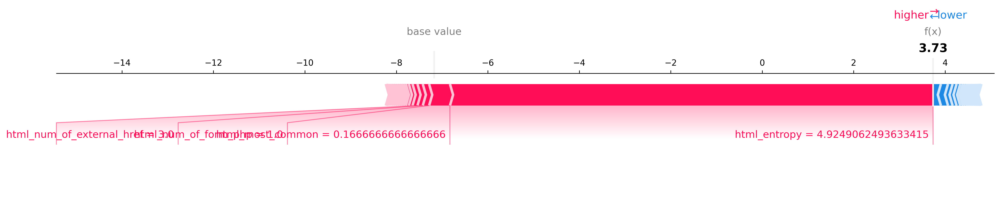

Domain: rossmann.gazetki-promocyjne.net.pl


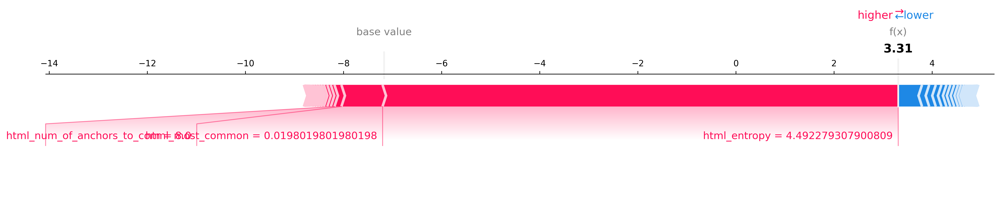

Domain: app.termly.io


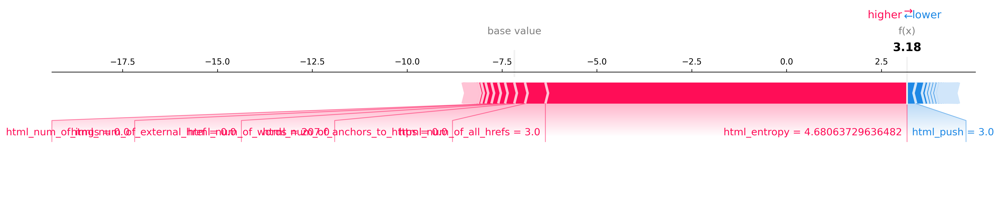

Domain: www.lacomediedevanneau.com


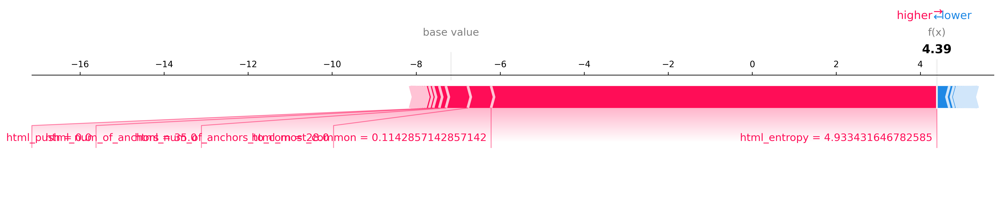

Domain: cs.cas.cz


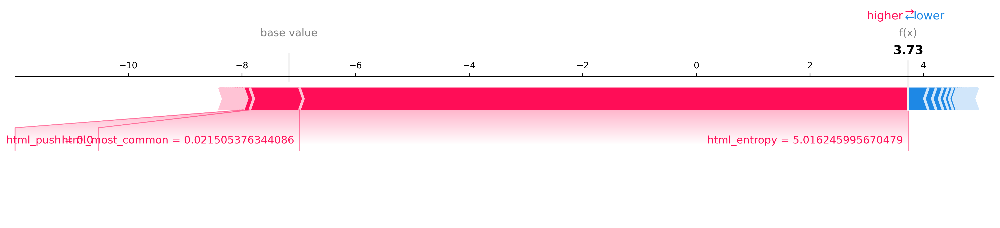

Domain: www.cliquef5.com.br


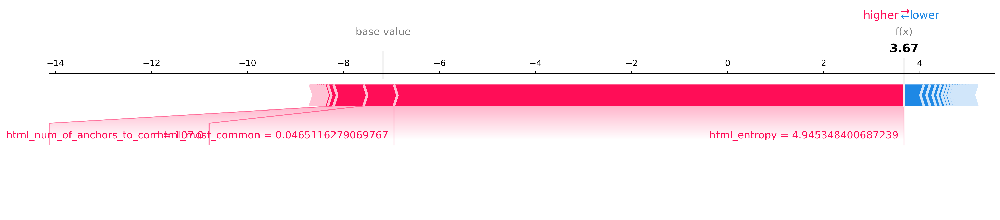

In [64]:

import shap

def display_shap_for_misclassified(model, misclassified, top_n=30):
    # Select the first N misclassified domains
    misclassified_subset = misclassified.head(top_n)

    # Extract features for the misclassified subset
    X_misclassified = misclassified_subset.drop(['label', 'domain_name'], axis=1)

    # Initialize SHAP explainer
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_misclassified)

    # Plot SHAP values for the misclassified domains
    for i in range(len(misclassified_subset)):
        domain_name = misclassified_subset.iloc[i]['domain_name']
        print(f'Domain: {domain_name}')
        shap.initjs()
        shap.force_plot(explainer.expected_value[1], shap_values[1][i], X_misclassified.iloc[i], matplotlib=True)

# Display SHAP values for the first N misclassified domains
display_shap_for_misclassified(model, misclassified, top_n=30)
